In [1]:
%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = "retina"

In [2]:
import addict
import matplotlib
import warnings

import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree

from matplotlib.collections import LineCollection

import celeri

# Read data and pre-process

In [3]:
COMMAND_FILE_NAME = "../data/command/japan_command_cmi_coupling.json"
command = celeri.get_command(COMMAND_FILE_NAME)
celeri.create_output_folder(command)
logger = celeri.get_logger(command)
segment, block, meshes, station, mogi, sar = celeri.read_data(command)
station = celeri.process_station(station, command)
segment = celeri.process_segment(segment, command, meshes)
sar = celeri.process_sar(sar, command)
closure, block = celeri.assign_block_labels(segment, station, block, mogi, sar)
assembly = addict.Dict()
operators = addict.Dict()
operators.meshes = [addict.Dict()] * len(meshes)
assembly = celeri.merge_geodetic_data(assembly, station, sar)

INFO: Read: ../data/command/japan_command_cmi_coupling.json - celeri.celeri:get_logger:7560 - 2024-11-20 16:49:24
INFO: RUN_NAME: 0000000554 - celeri.celeri:get_logger:7561 - 2024-11-20 16:49:24
INFO: Write log file: ../runs/0000000554/0000000554.log - celeri.celeri:get_logger:7562 - 2024-11-20 16:49:24
INFO: Reading data files - celeri.celeri:read_data:451 - 2024-11-20 16:49:24
SUCCESS: Read: ../data/segment/qp_japan_segment.csv - celeri.celeri:read_data:455 - 2024-11-20 16:49:24
SUCCESS: Read: ../data/block/japan_block.csv - celeri.celeri:read_data:460 - 2024-11-20 16:49:24
SUCCESS: Read: ../data/mesh/japan_mesh_parameters_cmi_coupling.json - celeri.celeri:read_data:467 - 2024-11-20 16:49:24

SUCCESS: Read: ../data/mesh/nankai.msh - celeri.celeri:read_mesh:446 - 2024-11-20 16:49:24

SUCCESS: Read: ../data/mesh/japan.msh - celeri.celeri:read_mesh:446 - 2024-11-20 16:49:25

SUCCESS: Read: ../data/mesh/sagami.msh - celeri.celeri:read_mesh:446 - 2024-11-20 16:49:25

SUCCESS: Read: ../dat

# Generate all operators, weighting, and data vector for KL+QP problem

In [4]:
# Get all elastic operators for segments and TDEs
celeri.get_elastic_operators(operators, meshes, segment, station, command)

# Get TDE smoothing operators
celeri.get_all_mesh_smoothing_matrices(meshes, operators)

# Block rotation to velocity operator
operators.rotation_to_velocities = celeri.get_rotation_to_velocities_partials(
    station, len(block)
)

# Soft block motion constraints
assembly, operators.block_motion_constraints = celeri.get_block_motion_constraints(
    assembly, block, command
)

# Soft slip rate constraints
assembly, operators.slip_rate_constraints = celeri.get_slip_rate_constraints(
    assembly, segment, block, command
)

# Rotation vectors to slip rate operator
operators.rotation_to_slip_rate = celeri.get_rotation_to_slip_rate_partials(
    segment, block
)

# Internal block strain rate operator
(
    operators.block_strain_rate_to_velocities,
    strain_rate_block_index,
) = celeri.get_block_strain_rate_to_velocities_partials(block, station, segment)

# Mogi source operator
operators.mogi_to_velocities = celeri.get_mogi_to_velocities_partials(
    mogi, station, command
)

# Soft TDE boundary condition constraints
celeri.get_tde_slip_rate_constraints(meshes, operators)

# Get index
index = celeri.get_index_eigen(assembly, segment, station, block, meshes, mogi)

# Get data vector for KL problem
data_vector_eigen = celeri.get_data_vector_eigen(meshes, assembly, index)

# Get data vector for KL problem
weighting_vector_eigen = celeri.get_weighting_vector_eigen(
    command, station, meshes, index
)

# Get KL modes for each mesh
celeri.get_eigenvectors_to_tde_slip(operators, meshes)

# Get full operator including all blocks, KL modes, strain blocks, and mogis
operators.eigen = celeri.get_full_dense_operator_eigen(operators, meshes, index)

# Get rotation to TDE kinematic slip rate operator for all meshes tied to segments
celeri.get_tde_coupling_constraints(meshes, segment, block, operators)

INFO: Computing elastic operators - celeri.celeri:get_elastic_operators:2053 - 2024-11-20 16:49:25


Calculating Okada partials for segments: 100%|██████████| 481/481 [00:04<00:00, 116.38it/s]


INFO: Start: TDE slip to velocity calculation for mesh: ../data/mesh/nankai.msh - celeri.celeri:get_elastic_operators:2061 - 2024-11-20 16:49:29


Calculating cutde partials for triangles: 100%|██████████| 1902/1902 [00:05<00:00, 337.60it/s]


SUCCESS: Finish: TDE slip to velocity calculation for mesh: ../data/mesh/nankai.msh - celeri.celeri:get_elastic_operators:2067 - 2024-11-20 16:49:35
INFO: Start: TDE slip to velocity calculation for mesh: ../data/mesh/japan.msh - celeri.celeri:get_elastic_operators:2061 - 2024-11-20 16:49:35


Calculating cutde partials for triangles: 100%|██████████| 2621/2621 [00:07<00:00, 346.96it/s]


SUCCESS: Finish: TDE slip to velocity calculation for mesh: ../data/mesh/japan.msh - celeri.celeri:get_elastic_operators:2067 - 2024-11-20 16:49:42
INFO: Start: TDE slip to velocity calculation for mesh: ../data/mesh/sagami.msh - celeri.celeri:get_elastic_operators:2061 - 2024-11-20 16:49:42


Calculating cutde partials for triangles: 100%|██████████| 231/231 [00:00<00:00, 346.58it/s]


SUCCESS: Finish: TDE slip to velocity calculation for mesh: ../data/mesh/sagami.msh - celeri.celeri:get_elastic_operators:2067 - 2024-11-20 16:49:43
INFO: Start: TDE slip to velocity calculation for mesh: ../data/mesh/japan_mock_cmi.msh - celeri.celeri:get_elastic_operators:2061 - 2024-11-20 16:49:43


Calculating cutde partials for triangles: 100%|██████████| 76/76 [00:00<00:00, 330.03it/s]


SUCCESS: Finish: TDE slip to velocity calculation for mesh: ../data/mesh/japan_mock_cmi.msh - celeri.celeri:get_elastic_operators:2067 - 2024-11-20 16:49:43
INFO: No slip rate constraints - celeri.celeri:get_slip_rate_constraints:3356 - 2024-11-20 16:49:44
INFO: Start: Eigenvectors to TDE slip for mesh: ../data/mesh/nankai.msh - celeri.celeri:get_eigenvectors_to_tde_slip:4456 - 2024-11-20 16:49:44
SUCCESS: Finish: Eigenvectors to TDE slip for mesh: ../data/mesh/nankai.msh - celeri.celeri:get_eigenvectors_to_tde_slip:4485 - 2024-11-20 16:49:45
INFO: Start: Eigenvectors to TDE slip for mesh: ../data/mesh/japan.msh - celeri.celeri:get_eigenvectors_to_tde_slip:4456 - 2024-11-20 16:49:45
SUCCESS: Finish: Eigenvectors to TDE slip for mesh: ../data/mesh/japan.msh - celeri.celeri:get_eigenvectors_to_tde_slip:4485 - 2024-11-20 16:49:48
INFO: Start: Eigenvectors to TDE slip for mesh: ../data/mesh/sagami.msh - celeri.celeri:get_eigenvectors_to_tde_slip:4456 - 2024-11-20 16:49:48
SUCCESS: Finish: 

# Solve bounded KL+QP problem

In [5]:
# Get QP bounds as inequality constraints
qp_inequality_constraints_matrix, qp_inequality_constraints_data_vector = (
    celeri.get_qp_all_inequality_operator_and_data_vector(
        index, meshes, operators, segment, block
    )
)

# QP solve
opts = {"show_progress": True}
solution_qp = celeri.lsqlin_qp(
    operators.eigen * np.sqrt(weighting_vector_eigen[:, None]),
    data_vector_eigen * np.sqrt(weighting_vector_eigen),
    0,
    qp_inequality_constraints_matrix,  # Inequality matrix
    qp_inequality_constraints_data_vector,  # Inequality data vector
    None,
    None,
    None,
    None,
    None,
    opts,
)


# Create estimation data structure and calculate derived quantities
estimation_qp = addict.Dict()
estimation_qp.state_vector = np.array(solution_qp["x"]).flatten()
estimation_qp.operator = operators.eigen
celeri.post_process_estimation_eigen(estimation_qp, operators, station, index)
celeri.write_output(command, estimation_qp, station, segment, block, meshes)

INFO: No hard slip rate bounds - celeri.celeri:get_slip_rate_bounds:4153 - 2024-11-20 16:49:48
     pcost       dcost       gap    pres   dres
 0: -2.9918e+04 -3.4698e+07  3e+07  2e-17  2e-15
 1: -4.4283e+04 -8.3736e+06  8e+06  3e-16  1e-15
 2: -4.4008e+04 -7.9965e+06  8e+06  3e-16  8e-16
 3: -4.4315e+04 -1.4707e+06  1e+06  3e-16  5e-16
 4: -4.6935e+04 -2.3546e+05  2e+05  3e-16  5e-16
 5: -4.9022e+04 -7.2078e+04  2e+04  3e-16  6e-16
 6: -5.0030e+04 -5.3424e+04  3e+03  3e-16  7e-16
 7: -5.0323e+04 -5.1166e+04  8e+02  3e-16  9e-16
 8: -5.0407e+04 -5.0735e+04  3e+02  3e-16  6e-16
 9: -5.0426e+04 -5.0647e+04  2e+02  3e-16  7e-16
10: -5.0439e+04 -5.0550e+04  1e+02  3e-16  5e-16
11: -5.0441e+04 -5.0521e+04  8e+01  3e-16  6e-16
12: -5.0444e+04 -5.0485e+04  4e+01  3e-16  6e-16
13: -5.0445e+04 -5.0463e+04  2e+01  3e-16  6e-16
14: -5.0445e+04 -5.0455e+04  1e+01  3e-16  5e-16
15: -5.0446e+04 -5.0450e+04  5e+00  3e-16  6e-16
16: -5.0446e+04 -5.0448e+04  2e+00  3e-16  5e-16
17: -5.0446e+04 -5.0447e

# Plot KL+QP estimation

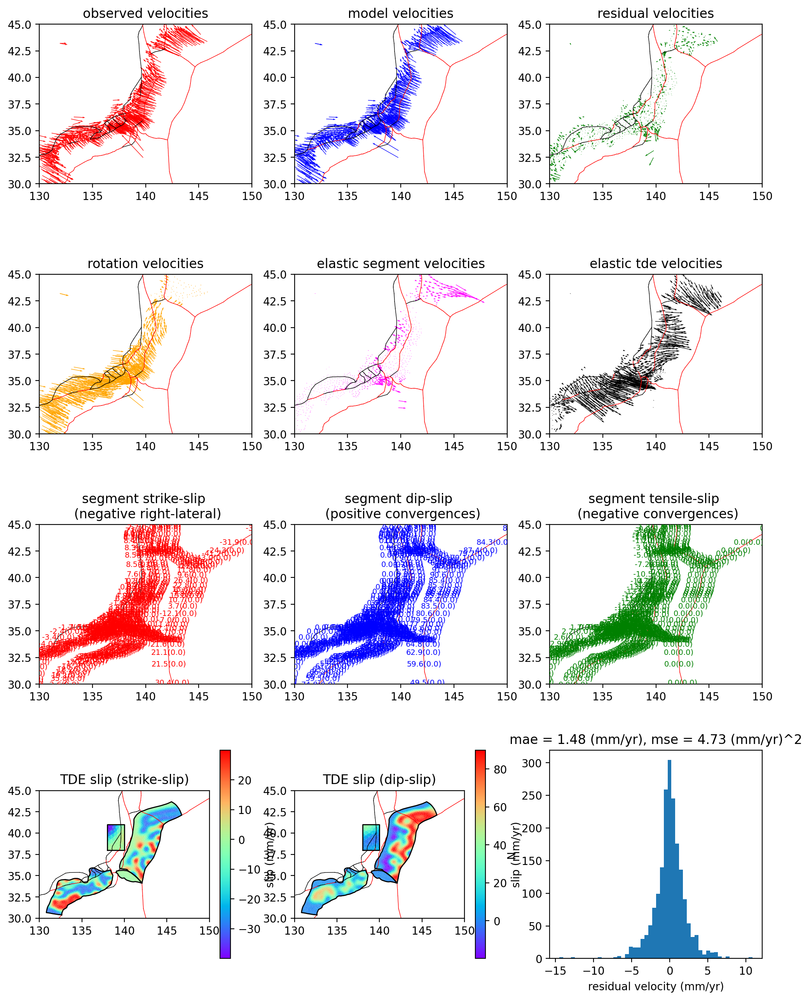

SUCCESS: Wrote figures../runs/0000000554/plot_estimation_summary.(pdf, png) - celeri.celeri:plot_estimation_summary:6601 - 2024-11-20 16:49:53


<Figure size 640x480 with 0 Axes>

In [6]:
celeri.plot_estimation_summary(
    command,
    segment,
    station,
    meshes,
    estimation_qp,
    lon_range=command.lon_range,
    lat_range=command.lat_range,
    quiver_scale=command.quiver_scale,
)

In [7]:
len(estimation_qp.state_vector)

# Multiply rotation vector components by TDE slip rate partials
jpl = (
    operators.rotation_to_tri_slip_rate[0]
    @ estimation_qp.state_vector[0 : 3 * len(block)]
)

# Multiply eigen modes by eigen to TDE matrix

bjm = (
    operators.eigenvectors_to_tde_slip[0]
    @ estimation_qp.state_vector[
        3 * len(block) : 3 * len(block)
        + (meshes[0].n_modes_strike_slip + meshes[0].n_modes_dip_slip)
    ]
)


def plot_mesh(meshes, fill_value, ax):
    x_coords = meshes.points[:, 0]
    y_coords = meshes.points[:, 1]
    vertex_array = np.asarray(meshes.verts)

    if not ax:
        ax = plt.gca()
    xy = np.c_[x_coords, y_coords]
    verts = xy[vertex_array]
    pc = matplotlib.collections.PolyCollection(verts, edgecolor="none", cmap="rainbow")
    pc.set_array(fill_value)
    ax.add_collection(pc)
    ax.autoscale()
    plt.colorbar(pc)

    # Add mesh edge
    x_edge = x_coords[meshes.ordered_edge_nodes[:, 0]]
    y_edge = y_coords[meshes.ordered_edge_nodes[:, 0]]
    x_edge = np.append(x_edge, x_coords[meshes.ordered_edge_nodes[0, 0]])
    y_edge = np.append(y_edge, y_coords[meshes.ordered_edge_nodes[0, 0]])
    plt.plot(x_edge, y_edge, color="black", linewidth=1)
    plt.gca().set_aspect("equal")

# Correct coupling calculation

In [8]:
def smooth_irregular_data(x_coords, y_coords, values, length_scale):
    # Build a KDTree for efficient neighbor searching
    points = np.vstack((x_coords, y_coords)).T
    tree = cKDTree(points)

    # Prepare an array to store the smoothed values
    smoothed_values = np.zeros_like(values)

    # Smoothing calculation
    for i, point in enumerate(points):
        # Find neighbors within 3 * length_scale for efficiency
        indices = tree.query_ball_point(point, 3 * length_scale)

        # Calculate distances and apply Gaussian weights
        distances = np.linalg.norm(points[indices] - point, axis=1)
        weights = np.exp(-(distances**2) / (2 * length_scale**2))

        # Weighted sum for smoothing
        smoothed_values[i] = np.sum(weights * values[indices]) / np.sum(weights)

    return smoothed_values


def colored_line_between_pts(x, y, c, ax, **lc_kwargs):
    """
    Plot a line with a color specified between (x, y) points by a third value.

    It does this by creating a collection of line segments between each pair of
    neighboring points. The color of each segment is determined by the
    made up of two straight lines each connecting the current (x, y) point to the
    midpoints of the lines connecting the current point with its two neighbors.
    This creates a smooth line with no gaps between the line segments.

    Parameters
    ----------
    x, y : array-like
        The horizontal and vertical coordinates of the data points.
    c : array-like
        The color values, which should have a size one less than that of x and y.
    ax : Axes
        Axis object on which to plot the colored line.
    **lc_kwargs
        Any additional arguments to pass to matplotlib.collections.LineCollection
        constructor. This should not include the array keyword argument because
        that is set to the color argument. If provided, it will be overridden.

    Returns
    -------
    matplotlib.collections.LineCollection
        The generated line collection representing the colored line.
    """
    if "array" in lc_kwargs:
        warnings.warn('The provided "array" keyword argument will be overridden')

    # Check color array size (LineCollection still works, but values are unused)
    if len(c) != len(x) - 1:
        warnings.warn(
            "The c argument should have a length one less than the length of x and y. "
            "If it has the same length, use the colored_line function instead."
        )

    # Create a set of line segments so that we can color them individually
    # This creates the points as an N x 1 x 2 array so that we can stack points
    # together easily to get the segments. The segments array for line collection
    # needs to be (numlines) x (points per line) x 2 (for x and y)
    points = np.array([x, y]).T.reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)
    lc = LineCollection(segments, **lc_kwargs)

    # Set the values used for colormapping
    lc.set_array(c)

    return ax.add_collection(lc)


# Smooth kinematic smooth
jpl_ss_smooth = smooth_irregular_data(
    meshes[0].lon_centroid, meshes[0].lat_centroid, jpl[0::2], length_scale=0.01
)

jpl_ds_smooth = smooth_irregular_data(
    meshes[0].lon_centroid, meshes[0].lat_centroid, jpl[1::2], length_scale=0.01
)

coupling_ss = bjm[0::2] / jpl_ss_smooth

# Iterative approach to finding a solution within coupling bounds

In [9]:
def check_coupling_bounds_single_mesh(
    meshes,
    mesh_idx,
    estimation_qp,
    current_ss_bounds_lower,
    current_ss_bounds_upper,
    current_ds_bounds_lower,
    current_ds_bounds_upper,
    debug_plot=False,
):
    """
    *mesh_parameter.json variable names for reference:

    TDE rate bounds:
    "qp_mesh_tde_bound": 1,
    "qp_mesh_tde_slip_rate_lower_bound_ss": -30,
    "qp_mesh_tde_slip_rate_upper_bound_ss": 30,
    "qp_mesh_tde_slip_rate_lower_bound_ds": 0,
    "qp_mesh_tde_slip_rate_upper_bound_ds": 60,

    TDE coupling bounds:
    "qp_mesh_tde_bound_coupling": 0,
    "qp_mesh_tde_slip_rate_lower_bound_ss_coupling": -0.5,
    "qp_mesh_tde_slip_rate_upper_bound_ss_coupling": 0.5,
    "qp_mesh_tde_slip_rate_lower_bound_ds_coupling": 0,
    "qp_mesh_tde_slip_rate_upper_bound_ds_coupling": 1,
    """

    # Multiply rotation vector components by TDE slip rate partials
    kinematic_tde_rates = (
        operators.rotation_to_tri_slip_rate[mesh_idx]
        @ estimation_qp.state_vector[0 : 3 * len(block)]
    )

    # Multiply eigen modes by eigen to TDE matrix
    estimated_tde_rates = (
        operators.eigenvectors_to_tde_slip[mesh_idx]
        @ estimation_qp.state_vector[
            3 * len(block) : 3 * len(block)
            + (meshes[mesh_idx].n_modes_strike_slip + meshes[mesh_idx].n_modes_dip_slip)
        ]  # TODO: Fix column indexing
    )

    # CASE 5: Normalize smooth rates and add threshold and resign
    kinematic_tde_rates_ss_smooth = smooth_irregular_data(
        meshes[mesh_idx].lon_centroid,
        meshes[mesh_idx].lat_centroid,
        kinematic_tde_rates[0::2],
        length_scale=0.01,
    )
    kinematic_tde_rates_ds_smooth = smooth_irregular_data(
        meshes[mesh_idx].lon_centroid,
        meshes[mesh_idx].lat_centroid,
        kinematic_tde_rates[1::2],
        length_scale=0.01,
    )
    kinematic_tde_rates_ss_smooth[np.abs(kinematic_tde_rates_ss_smooth) < 5.0] = (
        5.0
        * np.sign(
            kinematic_tde_rates_ss_smooth[np.abs(kinematic_tde_rates_ss_smooth) < 5.0]
        )
    )
    kinematic_tde_rates_ds_smooth[np.abs(kinematic_tde_rates_ds_smooth) < 5.0] = (
        5.0
        * np.sign(
            kinematic_tde_rates_ds_smooth[np.abs(kinematic_tde_rates_ds_smooth) < 5.0]
        )
    )
    tde_coupling_ss = estimated_tde_rates[0::2] / kinematic_tde_rates_ss_smooth
    tde_coupling_ds = estimated_tde_rates[1::2] / kinematic_tde_rates_ds_smooth

    # Find indices of TDEs with out of bound coupling values
    tde_coupling_ss_lower_oob_idx = np.where(
        tde_coupling_ss < meshes[mesh_idx].qp_mesh_tde_slip_rate_lower_bound_ss_coupling
    )[0]

    tde_coupling_ss_upper_oob_idx = np.where(
        tde_coupling_ss > meshes[mesh_idx].qp_mesh_tde_slip_rate_upper_bound_ss_coupling
    )[0]

    tde_coupling_ds_lower_oob_idx = np.where(
        tde_coupling_ds < meshes[mesh_idx].qp_mesh_tde_slip_rate_lower_bound_ds_coupling
    )[0]

    tde_coupling_ds_upper_oob_idx = np.where(
        tde_coupling_ss > meshes[mesh_idx].qp_mesh_tde_slip_rate_upper_bound_ds_coupling
    )[0]

    # Make vectors for update slip rates (not neccesary but useful for debugging)
    updated_ss_bounds_lower = np.copy(current_ss_bounds_lower)
    updated_ss_bounds_upper = np.copy(current_ss_bounds_upper)
    updated_ds_bounds_lower = np.copy(current_ds_bounds_lower)
    updated_ds_bounds_upper = np.copy(current_ds_bounds_upper)

    # Update slip rate bounds
    SLIP_RATE_REDUCTION_FACTOR = 0.70
    updated_ss_bounds_lower[tde_coupling_ss_lower_oob_idx] *= SLIP_RATE_REDUCTION_FACTOR
    updated_ss_bounds_upper[tde_coupling_ss_upper_oob_idx] *= SLIP_RATE_REDUCTION_FACTOR
    updated_ds_bounds_lower[tde_coupling_ds_lower_oob_idx] *= SLIP_RATE_REDUCTION_FACTOR
    updated_ds_bounds_upper[tde_coupling_ds_upper_oob_idx] *= SLIP_RATE_REDUCTION_FACTOR

    # updated_ss_bounds_lower[tde_coupling_ss_lower_oob_idx] += 3.0
    # updated_ss_bounds_upper[tde_coupling_ss_upper_oob_idx] += -3.0
    # updated_ds_bounds_lower[tde_coupling_ds_lower_oob_idx] += 3.0
    # updated_ds_bounds_upper[tde_coupling_ds_upper_oob_idx] += -3.0

    # Total number of OOB coupling constraints
    n_oob = (
        len(tde_coupling_ss_lower_oob_idx)
        + len(tde_coupling_ss_upper_oob_idx)
        + len(tde_coupling_ds_lower_oob_idx)
        + len(tde_coupling_ds_upper_oob_idx)
    )

    # Report on OOB cases
    logger.info(
        f"SS TDE COUPLING BOUNDS FOR MESH {mesh_idx}, min={meshes[mesh_idx].qp_mesh_tde_slip_rate_lower_bound_ss_coupling}, max={meshes[mesh_idx].qp_mesh_tde_slip_rate_upper_bound_ss_coupling}"
    )
    logger.info(
        f"DS TDE COUPLING BOUNDS FOR MESH {mesh_idx}, min={meshes[mesh_idx].qp_mesh_tde_slip_rate_lower_bound_ds_coupling}, max={meshes[mesh_idx].qp_mesh_tde_slip_rate_upper_bound_ds_coupling}"
    )

    # Report the number and type of coupling OOB
    logger.info(
        f"MIN SS TDE COUPLING BOUNDS FOR MESH {0}, OOB AT {len(tde_coupling_ss_lower_oob_idx)} TDEs"
    )
    logger.info(
        f"MAX SS TDE COUPLING BOUNDS FOR MESH {0}, OOB AT {len(tde_coupling_ss_upper_oob_idx)} TDEs"
    )
    logger.info(
        f"MIN DS TDE COUPLING BOUNDS FOR MESH {0}, OOB AT {len(tde_coupling_ds_lower_oob_idx)} TDEs"
    )
    logger.info(
        f"MAX DS TDE COUPLING BOUNDS FOR MESH {0}, OOB AT {len(tde_coupling_ds_upper_oob_idx)} TDEs"
    )
    logger.info(f"TOTAL TDES OOB {n_oob} TDEs")

    # Determine whether or not updating is required
    if n_oob > 0:
        continue_iterate_for_coupling_bounds = True
    else:
        continue_iterate_for_coupling_bounds = False
    logger.info(
        f"CONTINUE COUPLING RELAXATION ITERATION: {continue_iterate_for_coupling_bounds}"
    )

    if debug_plot == True:
        # Plot locations of TDEs with out of bound coupling values
        plt.figure(figsize=(11, 5))
        plt.subplot(1, 2, 1)
        plot_mesh(meshes[mesh_idx], tde_coupling_ss, plt.gca())
        plt.plot(
            meshes[mesh_idx].lon_centroid[tde_coupling_ss_lower_oob_idx],
            meshes[mesh_idx].lat_centroid[tde_coupling_ss_lower_oob_idx],
            "k+",
            label="below min",
        )
        plt.plot(
            meshes[mesh_idx].lon_centroid[tde_coupling_ss_upper_oob_idx],
            meshes[mesh_idx].lat_centroid[tde_coupling_ss_upper_oob_idx],
            "g+",
            label="above max",
        )
        plt.legend()
        plt.title("strike-slip coupling oob")

        plt.subplot(1, 2, 2)
        plot_mesh(meshes[mesh_idx], tde_coupling_ds, plt.gca())
        plt.plot(
            meshes[mesh_idx].lon_centroid[tde_coupling_ds_lower_oob_idx],
            meshes[mesh_idx].lat_centroid[tde_coupling_ds_lower_oob_idx],
            "bx",
            label="below min",
        )
        plt.plot(
            meshes[mesh_idx].lon_centroid[tde_coupling_ds_upper_oob_idx],
            meshes[mesh_idx].lat_centroid[tde_coupling_ds_upper_oob_idx],
            "g+",
            label="above max",
        )
        plt.legend()
        plt.title("dip-slip coupling oob")
        plt.show()

        # Plot adjusted bounds on mesh
        plt.figure(figsize=(20, 5))
        plt.subplot(1, 4, 1)
        plot_mesh(meshes[mesh_idx], updated_ss_bounds_lower, plt.gca())
        plt.title("ss adjusted lower bounds")
        plt.subplot(1, 4, 2)
        plot_mesh(meshes[mesh_idx], updated_ss_bounds_upper, plt.gca())
        plt.title("ss adjusted upper bounds")
        plt.subplot(1, 4, 3)
        plot_mesh(meshes[mesh_idx], updated_ds_bounds_lower, plt.gca())
        plt.title("ds adjusted lower bounds")
        plt.subplot(1, 4, 4)
        plot_mesh(meshes[mesh_idx], updated_ds_bounds_upper, plt.gca())
        plt.title("ds adjusted upper bounds")
        plt.show()

    return (
        continue_iterate_for_coupling_bounds,
        updated_ss_bounds_lower,
        updated_ss_bounds_upper,
        updated_ds_bounds_lower,
        updated_ds_bounds_upper,
        kinematic_tde_rates_ss_smooth,
        kinematic_tde_rates_ds_smooth,
        estimated_tde_rates[0::2],
        estimated_tde_rates[1::2],
        n_oob,
    )

INFO: 
ITERATION 0 - __main__:<module>:42 - 2024-11-20 16:49:54
INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:116 - 2024-11-20 16:49:54
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:119 - 2024-11-20 16:49:54
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 535 TDEs - __main__:check_coupling_bounds_single_mesh:124 - 2024-11-20 16:49:54
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 891 TDEs - __main__:check_coupling_bounds_single_mesh:127 - 2024-11-20 16:49:54
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 6 TDEs - __main__:check_coupling_bounds_single_mesh:130 - 2024-11-20 16:49:54
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 476 TDEs - __main__:check_coupling_bounds_single_mesh:133 - 2024-11-20 16:49:54
INFO: TOTAL TDES OOB 1908 TDEs - __main__:check_coupling_bounds_single_mesh:136 - 2024-11-20 16:49:54
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - 

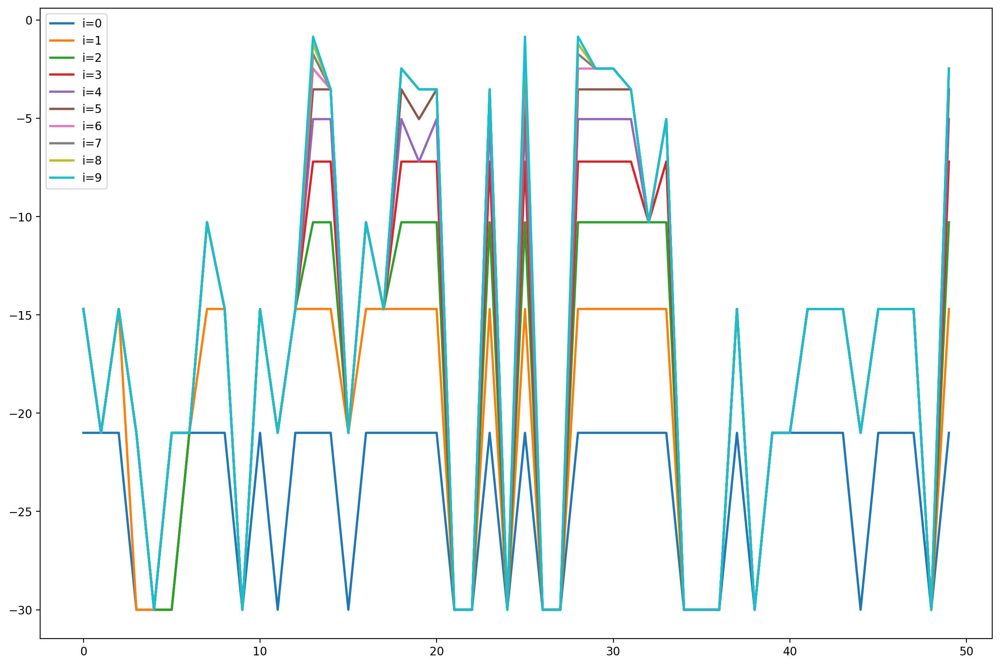

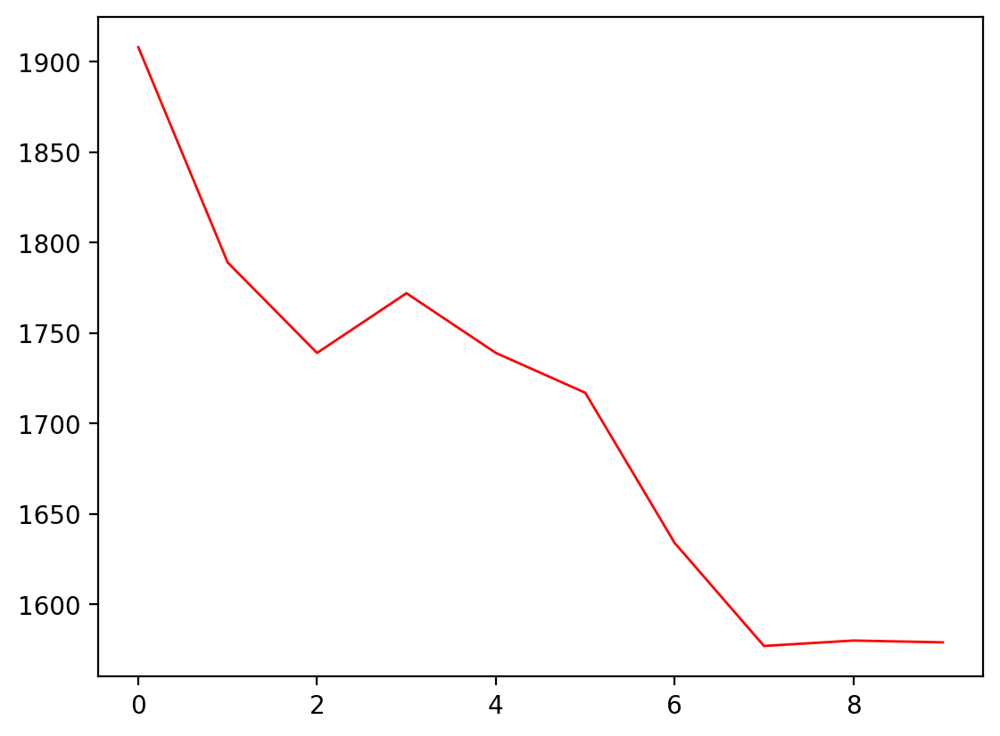

In [10]:
# Get total number of segment meshes
command.n_segment_meshes = np.max(segment.patch_file_name)

# Get intial ("current") TDE slip rates for each segment mesh
current_ss_bounds_lower = [np.array([])] * command.n_segment_meshes
current_ss_bounds_upper = [np.array([])] * command.n_segment_meshes
current_ds_bounds_lower = [np.array([])] * command.n_segment_meshes
current_ds_bounds_upper = [np.array([])] * command.n_segment_meshes

for i in range(command.n_segment_meshes):
    current_ss_bounds_lower[i] = meshes[
        i
    ].qp_mesh_tde_slip_rate_lower_bound_ss * np.ones(meshes[i].n_tde)
    current_ss_bounds_upper[i] = meshes[
        i
    ].qp_mesh_tde_slip_rate_upper_bound_ss * np.ones(meshes[i].n_tde)
    current_ds_bounds_lower[i] = meshes[
        i
    ].qp_mesh_tde_slip_rate_lower_bound_ds * np.ones(meshes[i].n_tde)
    current_ds_bounds_upper[i] = meshes[
        i
    ].qp_mesh_tde_slip_rate_upper_bound_ds * np.ones(meshes[i].n_tde)


# Start relaxation iterations
plt.figure(figsize=(15, 10))
n_iter = 10
n_oob_vec = np.zeros(n_iter)
store_ss_lower = np.zeros((meshes[0].n_tde, n_iter))
store_ss_upper = np.zeros((meshes[0].n_tde, n_iter))
store_ds_lower = np.zeros((meshes[0].n_tde, n_iter))
store_ds_upper = np.zeros((meshes[0].n_tde, n_iter))
store_ss_jpl = np.zeros((meshes[0].n_tde, n_iter))
store_ss_bjm = np.zeros((meshes[0].n_tde, n_iter))
store_ds_jpl = np.zeros((meshes[0].n_tde, n_iter))
store_ds_bjm = np.zeros((meshes[0].n_tde, n_iter))


for i in range(n_iter):

    # Check bounds
    logger.info(f"\nITERATION {i}")
    (
        continue_iterate_for_coupling_bounds,
        updated_ss_bounds_lower,
        updated_ss_bounds_upper,
        updated_ds_bounds_lower,
        updated_ds_bounds_upper,
        kinematic_tde_rates_ss,
        kinematic_tde_rates_ds,
        estimated_tde_rates_ss,
        estimated_tde_rates_ds,
        n_oob,
    ) = check_coupling_bounds_single_mesh(
        meshes,
        0,  # This is the mesh index
        estimation_qp,
        current_ss_bounds_lower[0],
        current_ss_bounds_upper[0],
        current_ds_bounds_lower[0],
        current_ds_bounds_upper[0],
        debug_plot=False,
    )
    logger.info(f"{n_oob} TDEs with out of coupling bounds")

    # Store total number of OOB elements at this iteration step
    n_oob_vec[i] = n_oob

    # Build and insert update slip rate bounds into QP inequality vector
    updated_lower_bounds = -1.0 * celeri.interleave2(
        updated_ss_bounds_lower, updated_ds_bounds_lower
    )
    updated_upper_bounds = celeri.interleave2(
        updated_ss_bounds_upper, updated_ds_bounds_upper
    )
    updated_bounds = np.hstack((updated_lower_bounds, updated_upper_bounds))

    # Insert updated bounds into data vector for ineqaulity constraints
    updated_qp_inequality_constraints_data_vector = np.copy(
        qp_inequality_constraints_data_vector
    )
    updated_qp_inequality_constraints_data_vector[0 : len(updated_bounds)] = (
        updated_bounds
    )

    # QP solve with updated TDE slip rate constraints
    solution_qp = celeri.lsqlin_qp(
        operators.eigen * np.sqrt(weighting_vector_eigen[:, None]),
        data_vector_eigen * np.sqrt(weighting_vector_eigen),
        0,
        qp_inequality_constraints_matrix,  # Inequality matrix
        updated_qp_inequality_constraints_data_vector,  # Inequality data vector
        None,
        None,
        None,
        None,
        None,
        {"show_progress": False},
    )

    # Create estimation data structure and calculate derived quantities
    estimation_qp.state_vector = np.array(solution_qp["x"]).flatten()
    estimation_qp.operator = operators.eigen
    celeri.post_process_estimation_eigen(estimation_qp, operators, station, index)

    # Set *updated* to *current* for next iteration
    current_ss_bounds_lower[0] = np.copy(updated_ss_bounds_lower)
    current_ss_bounds_upper[0] = np.copy(updated_ss_bounds_upper)
    current_ds_bounds_lower[0] = np.copy(updated_ds_bounds_lower)
    current_ds_bounds_upper[0] = np.copy(updated_ds_bounds_upper)

    # Store values for understanding
    store_ss_lower[:, i] = current_ss_bounds_lower[0]
    store_ss_upper[:, i] = current_ss_bounds_upper[0]
    store_ds_lower[:, i] = current_ds_bounds_lower[0]
    store_ds_upper[:, i] = current_ds_bounds_upper[0]
    store_ss_jpl[:, i] = kinematic_tde_rates_ss
    store_ss_bjm[:, i] = estimated_tde_rates_ss
    store_ds_jpl[:, i] = kinematic_tde_rates_ds
    store_ds_bjm[:, i] = estimated_tde_rates_ds

    plt.plot(current_ss_bounds_lower[0][0:50], linewidth=2.0, label=f"{i=}")

plt.legend()
plt.show()

# Plot convergence
plt.figure()
plt.plot(n_oob_vec, "-r", linewidth=1.0)
plt.show()

(1902, 10)


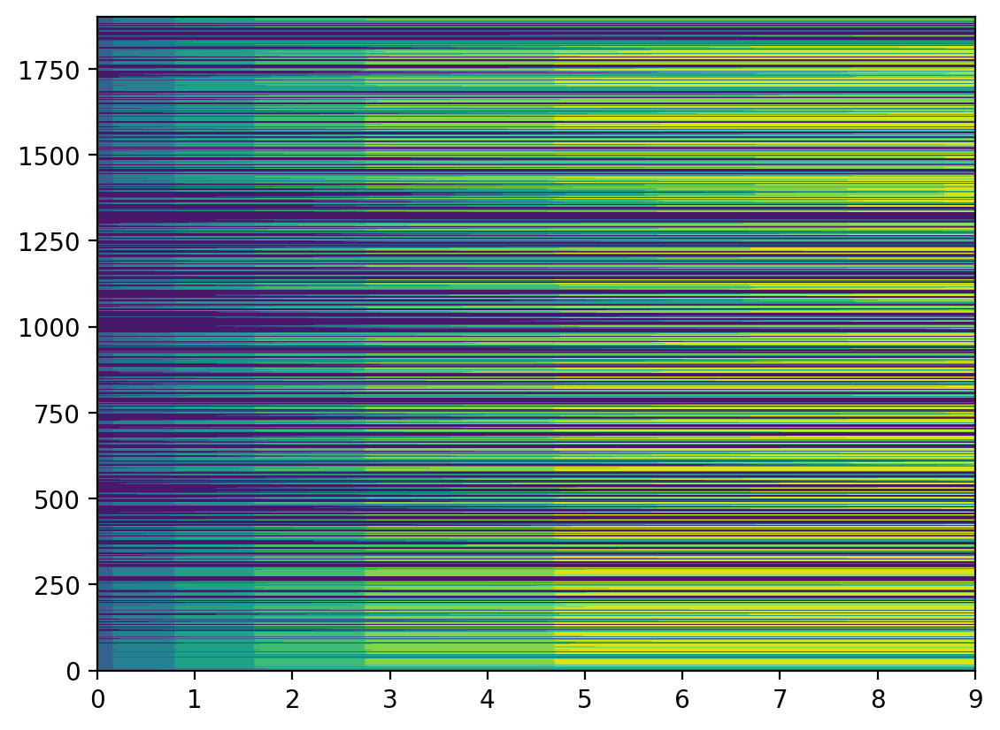

In [11]:
plt.contourf(store_ss_lower)
print(store_ss_lower.shape)
store_ss_lower[i, :]

array_to_check = store_ss_lower
for i in range(meshes[0].n_tde):
    is_monotonic_increasing = np.all(
        array_to_check[i, :][1:] >= array_to_check[i, :][:-1]
    )
    if not is_monotonic_increasing:
        print(i)

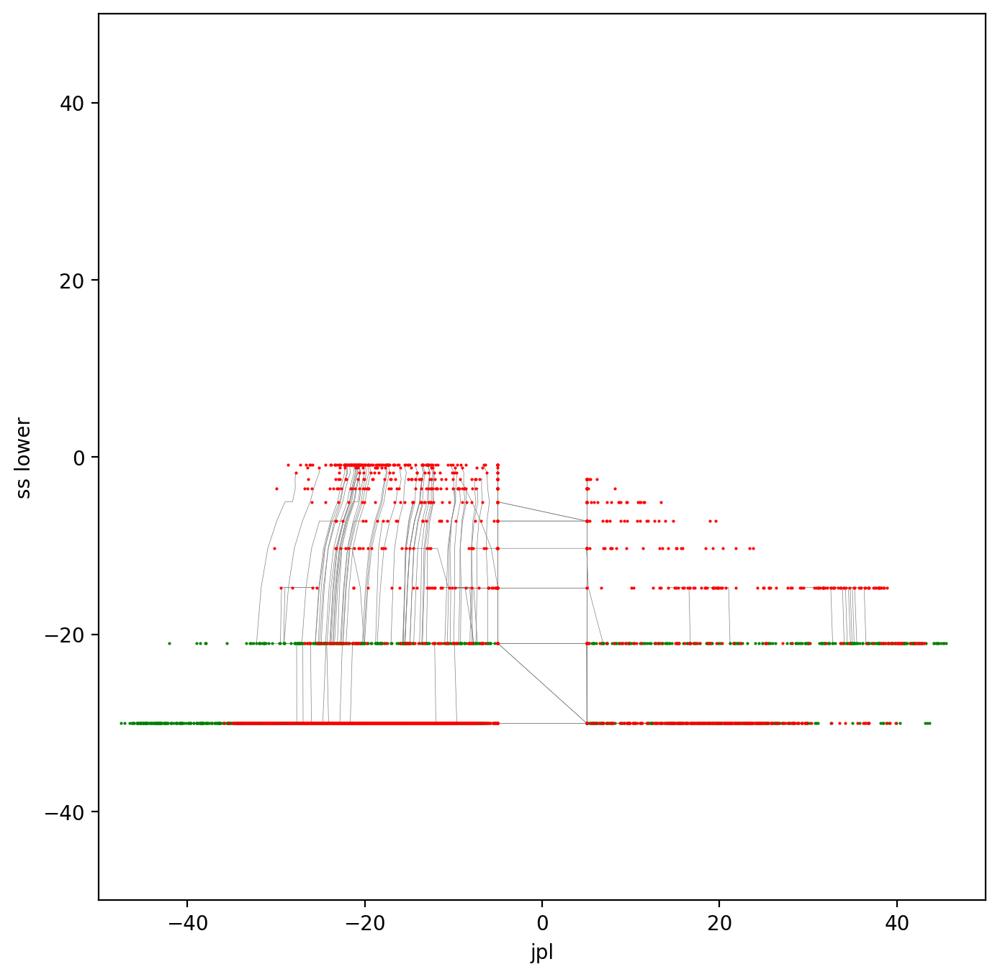

In [12]:
store_ss_lower.shape
n = meshes[0].n_tde
n = 200
plt.figure(figsize=(8, 8))
for i in range(n):
    plt.plot(
        store_ss_jpl[i, :],
        store_ss_lower[i, :],
        "-",
        linewidth=0.25,
        color="gray",
        zorder=1,
    )


plt.plot(
    store_ss_jpl[:, 0],
    store_ss_lower[:, 0],
    "g.",
    linewidth=0.25,
    markersize=1.0,
    zorder=1,
)


plt.plot(
    store_ss_jpl[:, -1],
    store_ss_lower[:, -1],
    "r.",
    linewidth=0.25,
    markersize=1.0,
    zorder=1,
)


# for i in range(n):
#     point_sizes = np.arange(1, len(store_ss_lower[i, :]) + 1) * 0.5
#     plt.scatter(
#         store_ss_jpl[i, :],
#         store_ss_lower[i, :],
#         s=point_sizes,
#         color="blue",
#         alpha=0.1,
#         zorder=2,
#     )

plt.xlim([-50, 50])
plt.ylim([-50, 50])
plt.gca().set_aspect("equal")
plt.xlabel("jpl")
plt.ylabel("ss lower")
plt.show()

/var/folders/pq/qqjshcd51vg5t9w5ws8wkmw00000gn/T/ipykernel_86449/1137276405.py:57: UserWarning: The c argument should have a length one less than the length of x and y. If it has the same length, use the colored_line function instead.
  warnings.warn(


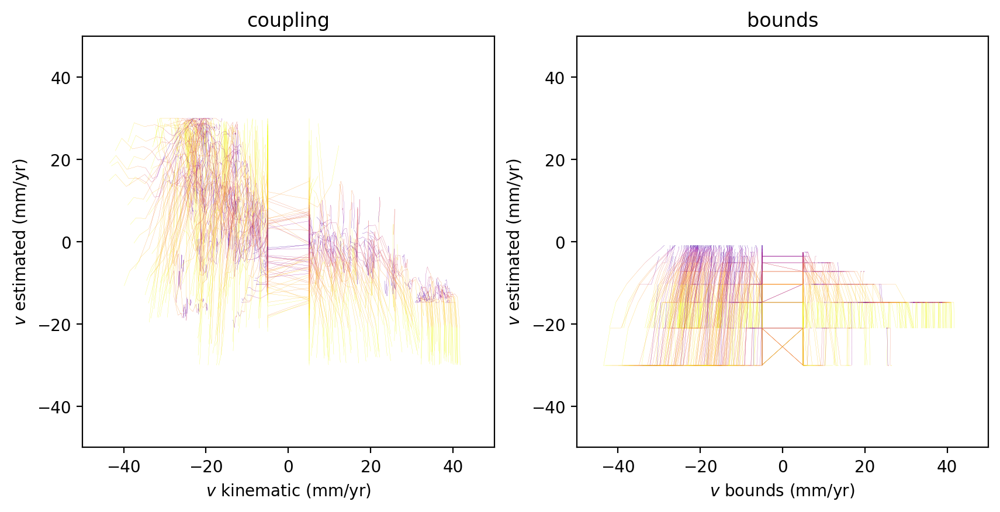

In [13]:
iters = np.array(range(len(store_ss_jpl[0, :])))
n = meshes[0].n_tde
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
for i in range(n):
    if not np.all(store_ss_lower[i, :] == store_ss_lower[i, :][0]):
        if np.all(store_ss_lower[i, :][0] < 0):
            line = colored_line_between_pts(
                store_ss_jpl[i, :],
                store_ss_bjm[i, :],
                iters,
                plt.gca(),
                linewidth=0.1,
                cmap="plasma_r",
            )
plt.xlim([-50, 50])
plt.ylim([-50, 50])
plt.gca().set_aspect("equal")
plt.xlabel("$v$ kinematic (mm/yr)")
plt.ylabel("$v$ estimated (mm/yr)")
plt.title("coupling")

plt.subplot(1, 2, 2)
for i in range(n):
    if not np.all(store_ss_lower[i, :] == store_ss_lower[i, :][0]):
        line = colored_line_between_pts(
            store_ss_jpl[i, :],
            store_ss_lower[i, :],
            iters,
            plt.gca(),
            linewidth=0.1,
            cmap="plasma_r",
        )

plt.xlim([-50, 50])
plt.ylim([-50, 50])
plt.gca().set_aspect("equal")
plt.xlabel("$v$ bounds (mm/yr)")
plt.ylabel("$v$ estimated (mm/yr)")
plt.title("bounds")

plt.show()

# Plot estimates vs bounds
- Check to make sure that we are always within bounds

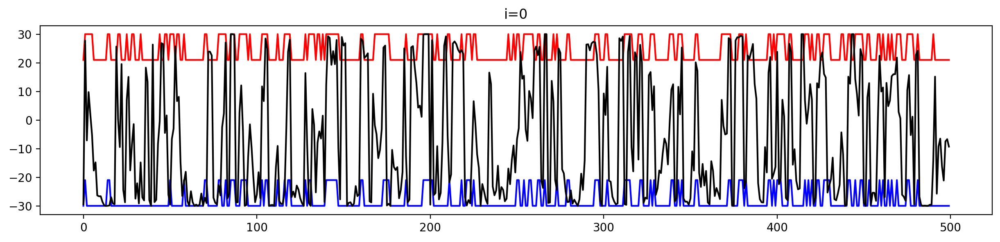

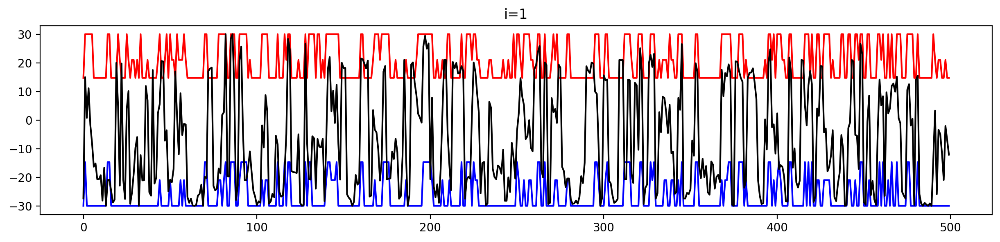

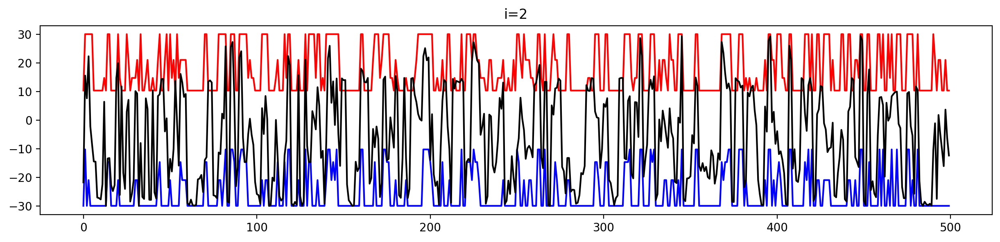

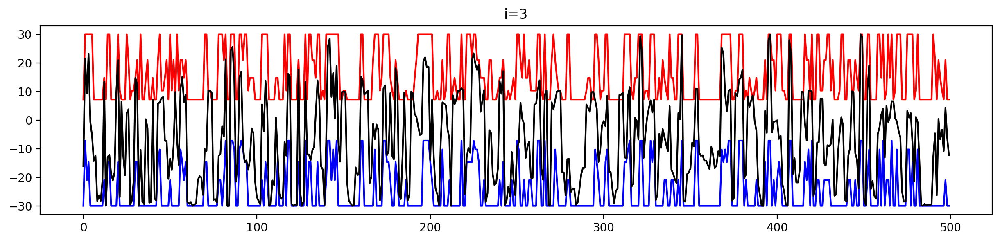

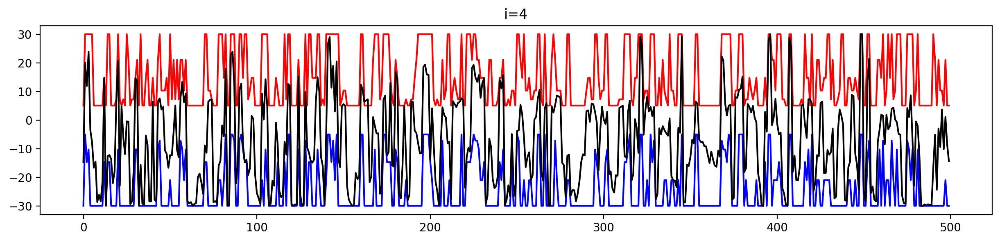

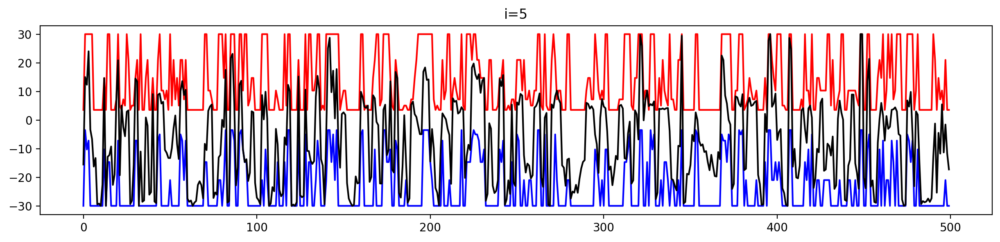

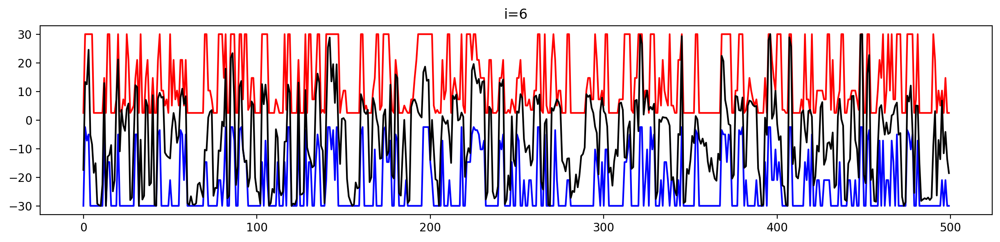

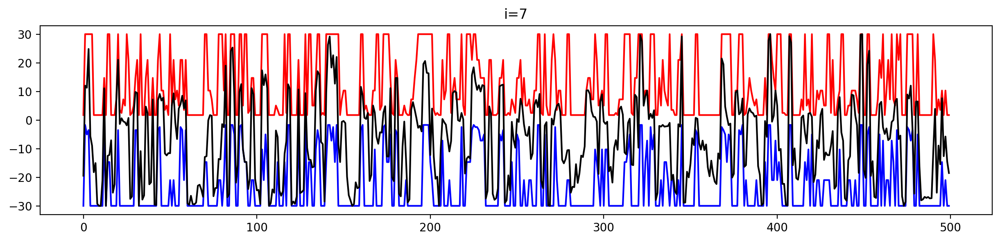

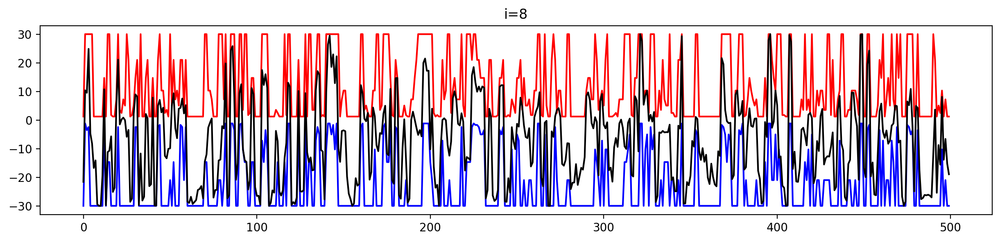

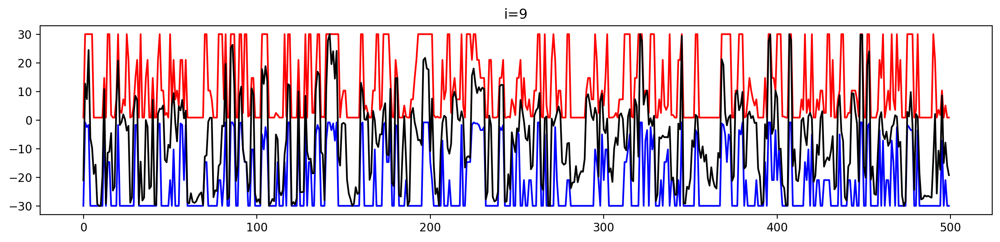

In [21]:
start_idx = 500
end_idx = 1000

for i in range(n_iter):
    plt.figure(figsize=(15, 3))
    plt.plot(store_ss_lower[start_idx:end_idx, i], "-b", label="lower")
    plt.plot(store_ss_upper[start_idx:end_idx, i], "-r", label="upper")
    plt.plot(store_ss_bjm[start_idx:end_idx, i], "-k", label="estimated")
    plt.title(f"{i=}")
    plt.legend
    plt.show()

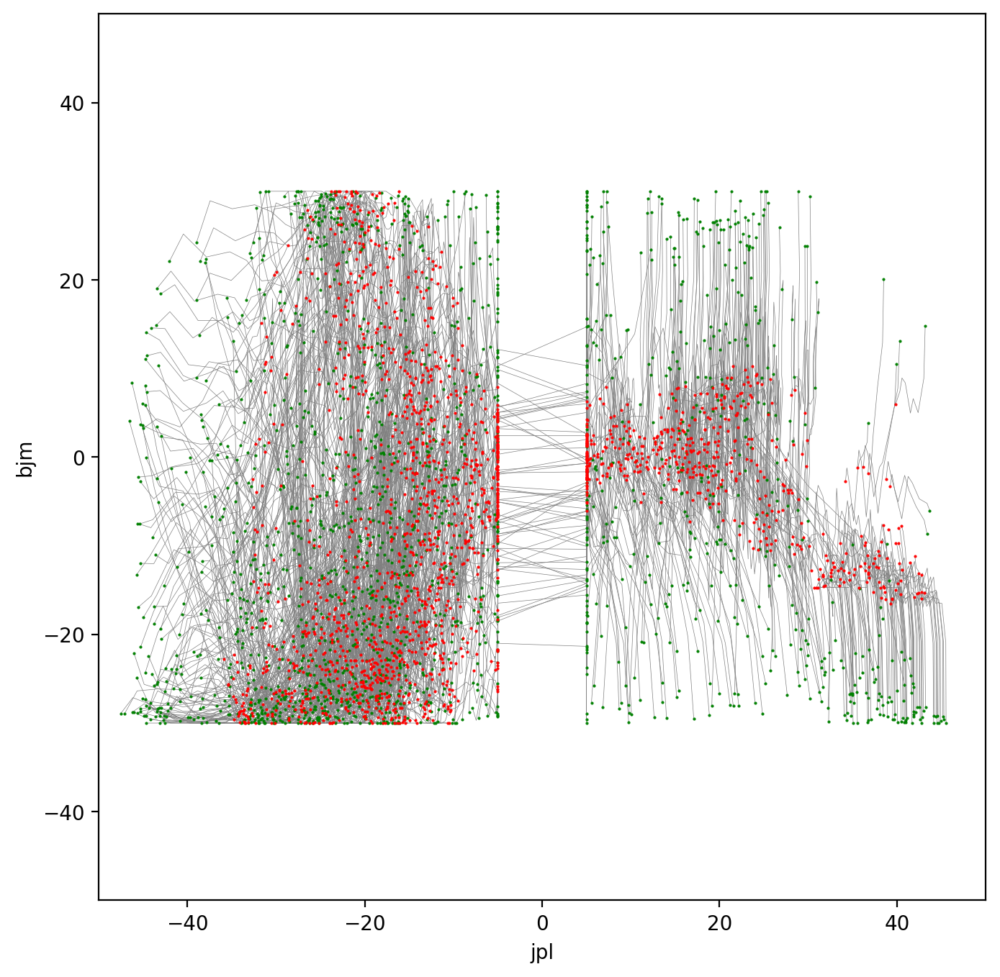

In [15]:
n = meshes[0].n_tde
# n = 100
plt.figure(figsize=(8, 8))
for i in range(n):
    plt.plot(
        store_ss_jpl[i, :],
        store_ss_bjm[i, :],
        "-",
        linewidth=0.25,
        color="gray",
        zorder=1,
    )

plt.plot(
    store_ss_jpl[:, 0],
    store_ss_bjm[:, 0],
    "g.",
    linewidth=0.25,
    markersize=1.0,
    zorder=1,
)

plt.plot(
    store_ss_jpl[:, -1],
    store_ss_bjm[:, -1],
    "r.",
    linewidth=0.25,
    markersize=1.0,
    zorder=1,
)

# for i in range(n):
#     point_sizes = np.arange(1, len(store_ss_jpl[i, :]) + 1) * 0.5
#     plt.scatter(
#         store_ss_jpl[i, :],
#         store_ss_bjm[i, :],
#         s=point_sizes,
#         color="blue",
#         alpha=0.1,
#         zorder=2,
#     )

plt.xlim([-50, 50])
plt.ylim([-50, 50])
plt.gca().set_aspect("equal")
plt.xlabel("jpl")
plt.ylabel("bjm")
plt.show()

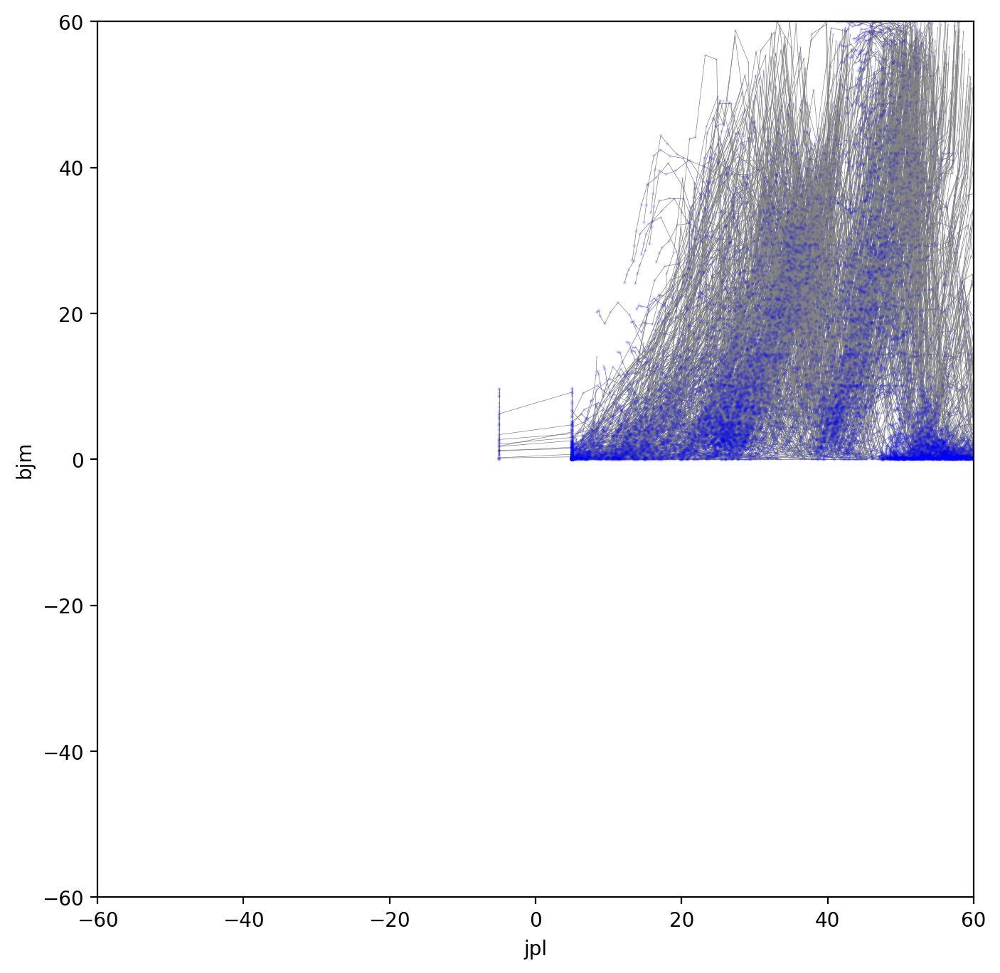

In [16]:
plt.figure(figsize=(8, 8))
for i in range(meshes[0].n_tde):
    plt.plot(
        store_ds_jpl[i, :],
        store_ds_bjm[i, :],
        "-",
        linewidth=0.25,
        color="gray",
        zorder=1,
    )

for i in range(meshes[0].n_tde):
    point_sizes = np.arange(1, len(store_ds_jpl[i, :]) + 1) * 0.1
    plt.scatter(
        store_ds_jpl[i, :],
        store_ds_bjm[i, :],
        s=point_sizes,
        color="blue",
        alpha=0.1,
        zorder=2,
    )

plt.xlim([-60, 60])
plt.ylim([-60, 60])
plt.gca().set_aspect("equal")
plt.xlabel("jpl")
plt.ylabel("bjm")
plt.show()

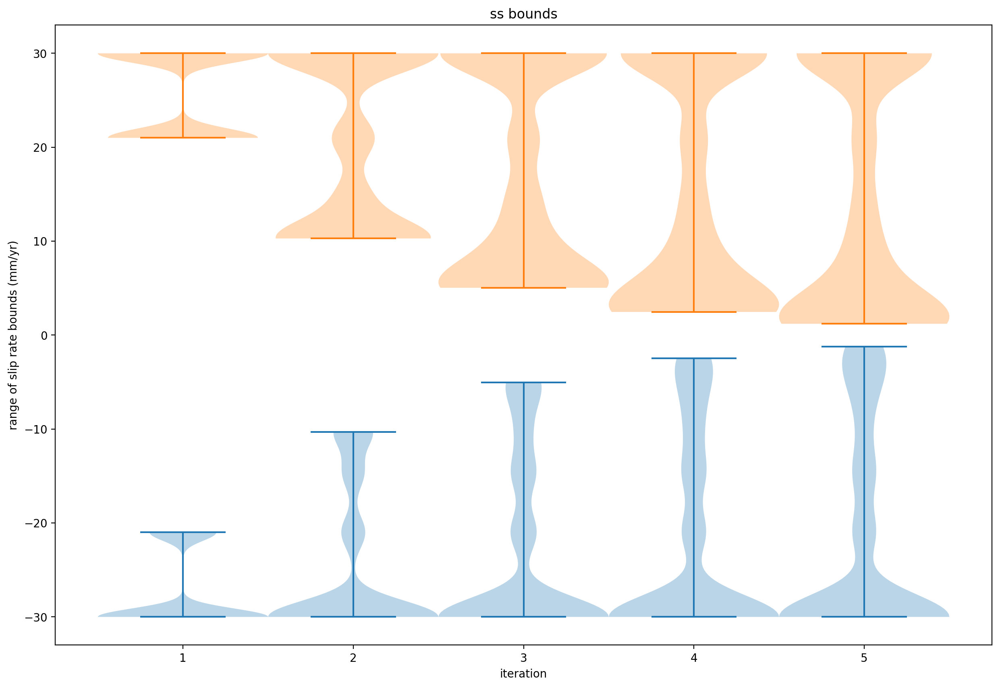

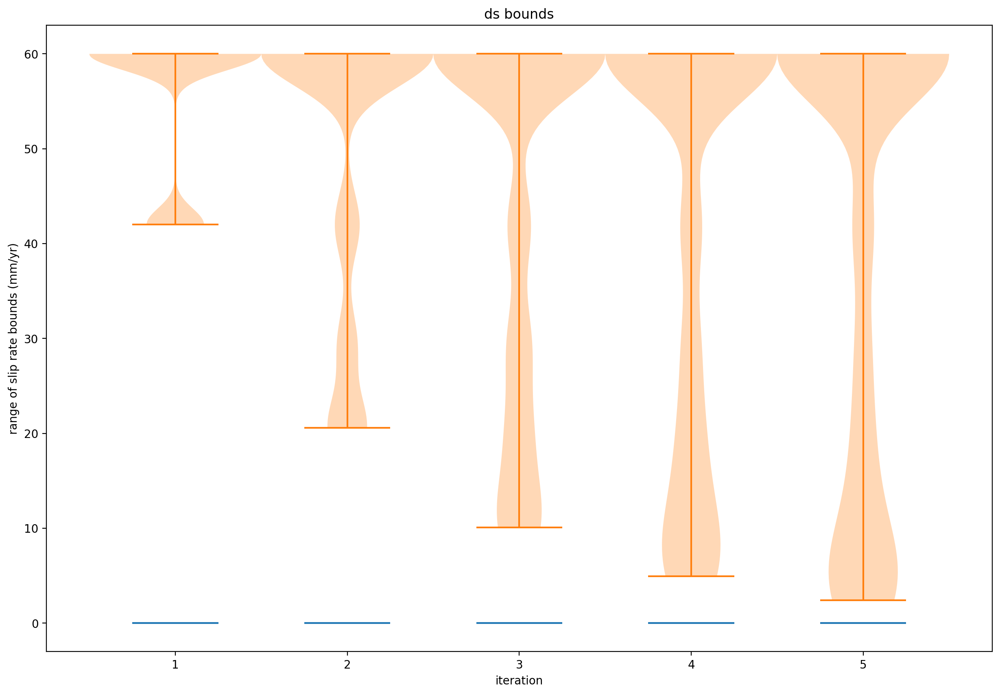

In [17]:
plt.figure(figsize=(15, 10))
plt.violinplot(store_ss_lower[:, 0::2], showmeans=False, showmedians=False, widths=1.0)
plt.violinplot(store_ss_upper[:, 0::2], showmeans=False, showmedians=False, widths=1.0)
plt.xlabel("iteration")
plt.ylabel("range of slip rate bounds (mm/yr)")
plt.title("ss bounds")
plt.show()

plt.figure(figsize=(15, 10))
plt.violinplot(store_ds_lower[:, 0::2], showmeans=False, showmedians=False, widths=1.0)
plt.violinplot(store_ds_upper[:, 0::2], showmeans=False, showmedians=False, widths=1.0)
plt.xlabel("iteration")
plt.ylabel("range of slip rate bounds (mm/yr)")
plt.title("ds bounds")
plt.show()

# Plot complete model result after coupling iterations

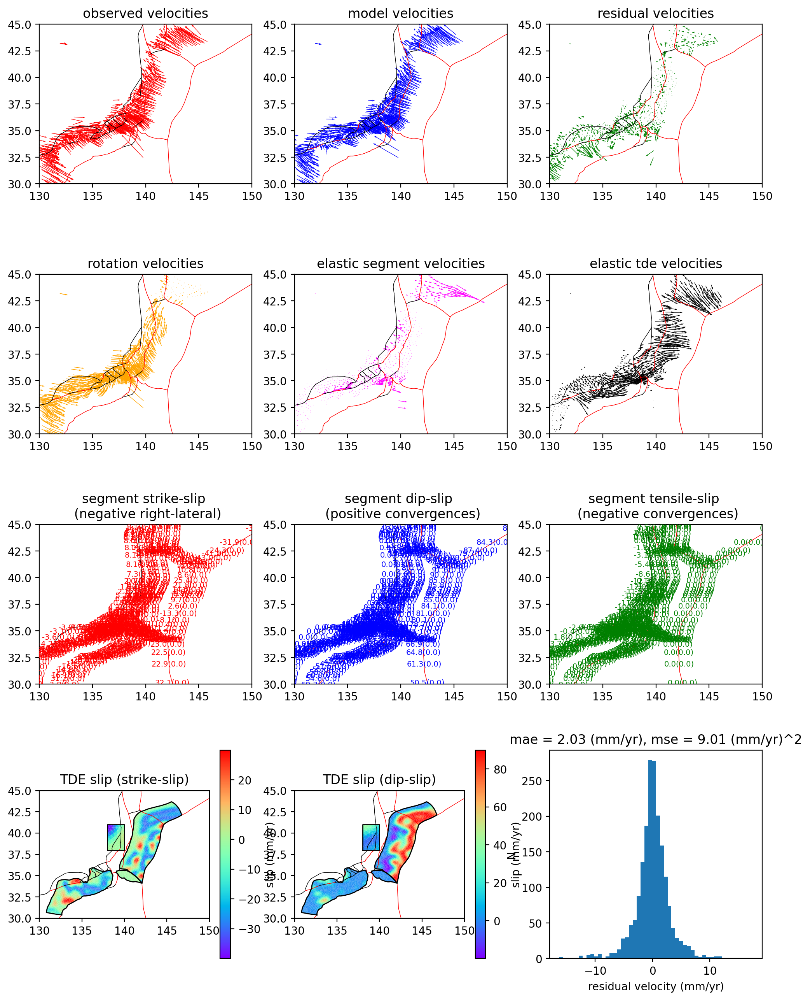

SUCCESS: Wrote figures../runs/0000000554/plot_estimation_summary.(pdf, png) - celeri.celeri:plot_estimation_summary:6601 - 2024-11-20 16:50:22


<Figure size 640x480 with 0 Axes>

In [18]:
celeri.plot_estimation_summary(
    command,
    segment,
    station,
    meshes,
    estimation_qp,
    lon_range=command.lon_range,
    lat_range=command.lat_range,
    quiver_scale=command.quiver_scale,
)

# Plot final slip rates and coupling distributions

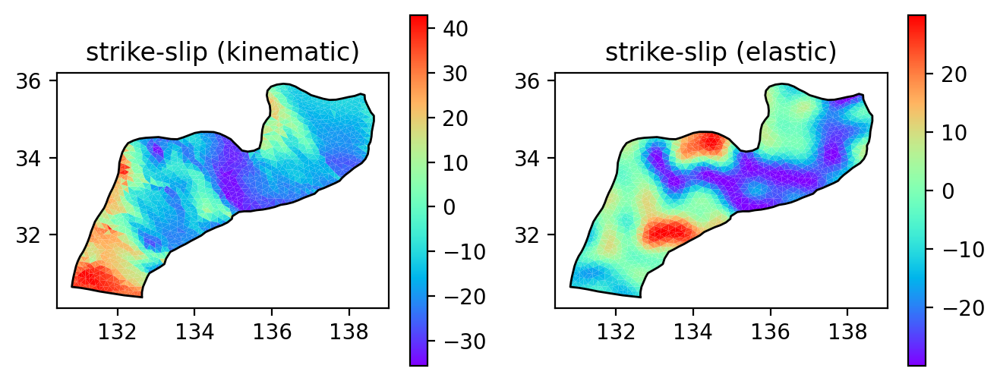

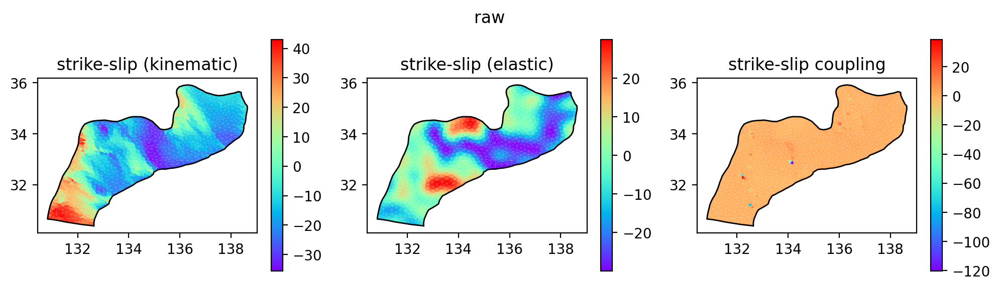

In [19]:
# Multiply rotation vector components by TDE slip rate partials
jpl = (
    operators.rotation_to_tri_slip_rate[0]
    @ estimation_qp.state_vector[0 : 3 * len(block)]
)

# Multiply eigen modes by eigen to TDE matrix
bjm = (
    operators.eigenvectors_to_tde_slip[0]
    @ estimation_qp.state_vector[
        3 * len(block) : 3 * len(block)
        + meshes[0].n_modes_strike_slip
        + meshes[0].n_modes_dip_slip
    ]
)

plt.figure(figsize=(12, 3))
plt.subplot(1, 3, 1)
plot_mesh(meshes[0], jpl[0::2], plt.gca())
plt.title("strike-slip (kinematic)")

plt.subplot(1, 3, 2)
plot_mesh(meshes[0], bjm[0::2], plt.gca())
plt.title("strike-slip (elastic)")


# Smooth kinematic smooth
jpl_ss_smooth = smooth_irregular_data(
    meshes[0].lon_centroid, meshes[0].lat_centroid, jpl[0::2], length_scale=0.01
)

jpl_ds_smooth = smooth_irregular_data(
    meshes[0].lon_centroid, meshes[0].lat_centroid, jpl[1::2], length_scale=0.01
)

jpl_ss_smooth[np.abs(jpl_ss_smooth) < 5.0] = 5.0

coupling_ss = bjm[0::2] / np.abs(jpl_ss_smooth)

plt.figure(figsize=(12, 3))
plt.subplot(1, 3, 1)
plot_mesh(meshes[0], jpl[0::2], plt.gca())
plt.title("strike-slip (kinematic)")

plt.subplot(1, 3, 2)
plot_mesh(meshes[0], bjm[0::2], plt.gca())
plt.title("strike-slip (elastic)")

plt.subplot(1, 3, 3)
plot_mesh(meshes[0], bjm[0::2] / jpl[0::2], plt.gca())
plt.title("strike-slip coupling")
plt.suptitle("raw")
plt.show()

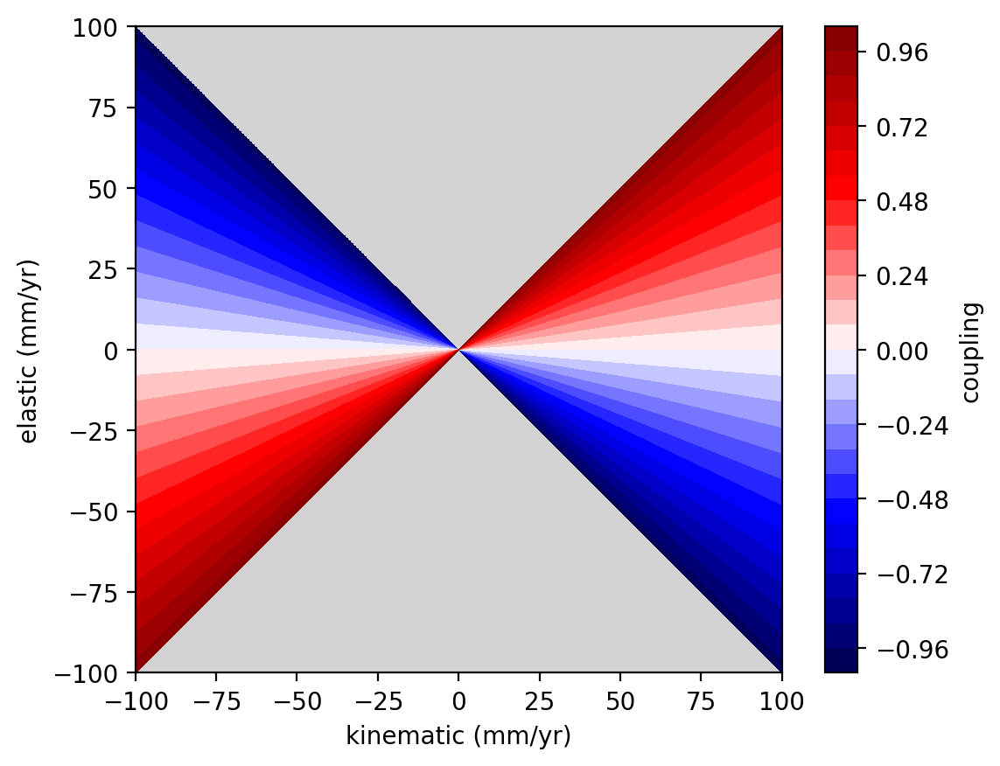

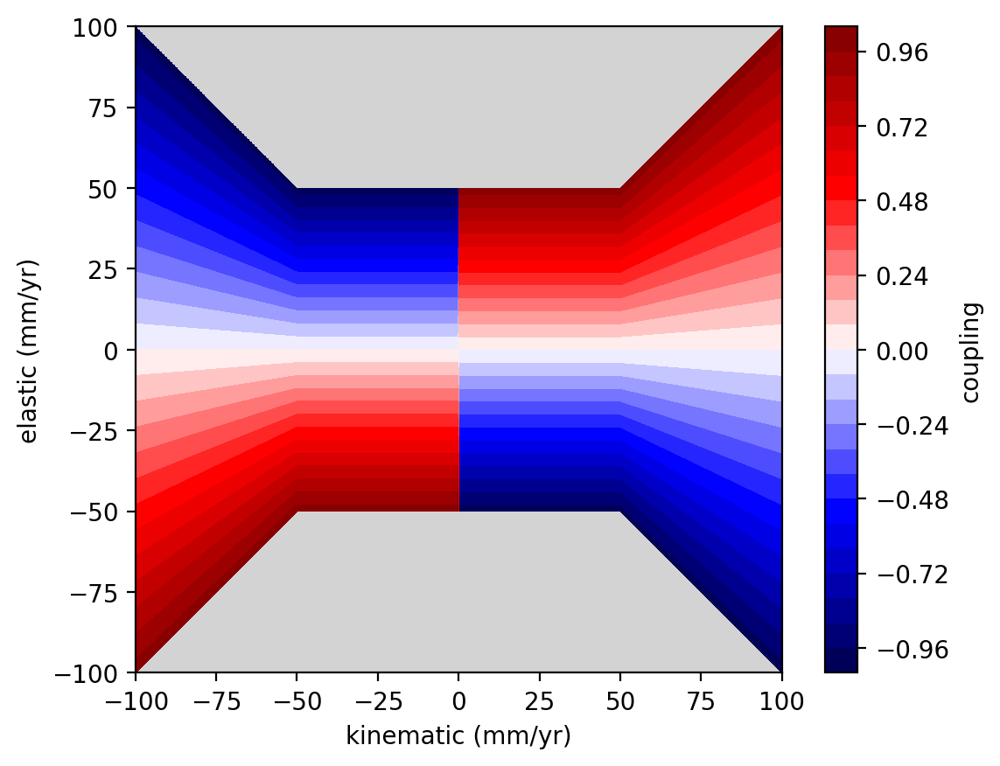

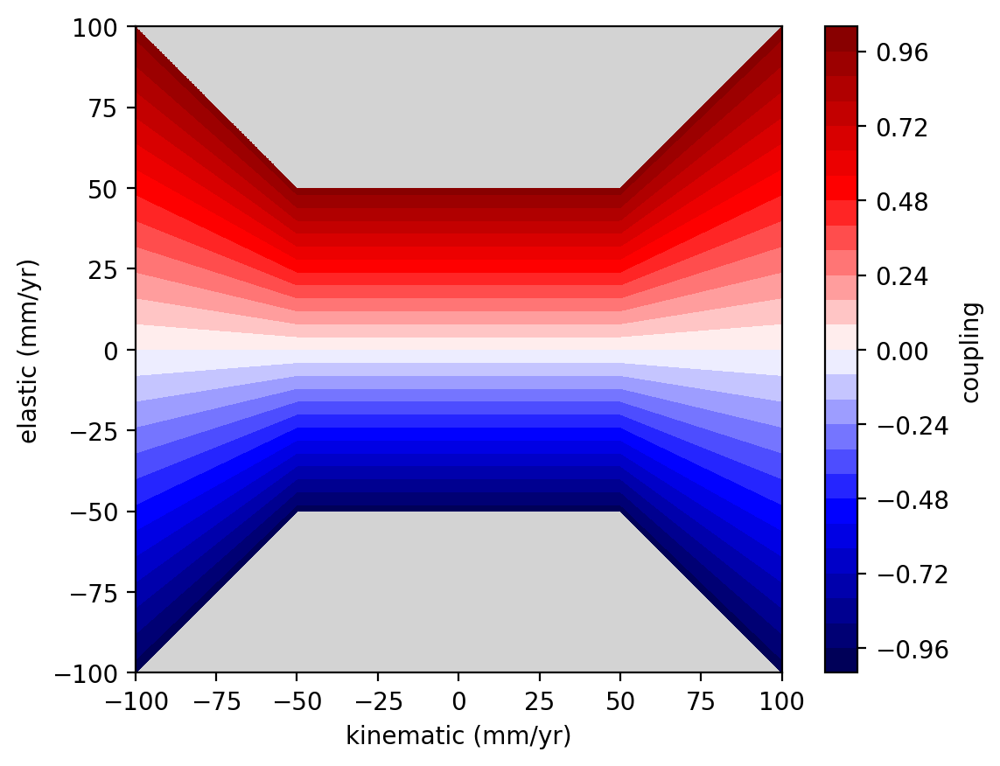

In [20]:
levels = 31
j_cutoff = 50.0

j = np.linspace(-100, 100, 1000)
b = np.linspace(-100, 100, 1000)
j_grid, b_grid = np.meshgrid(j, b)
j_grid_orig = np.copy(j_grid)
b_grid_orig = np.copy(b_grid)


coupling_grid = b_grid / (j_grid)
coupling_grid[coupling_grid > 1] = np.nan
coupling_grid[coupling_grid < -1] = np.nan

plt.figure()
plt.contourf(j_grid_orig, b_grid_orig, coupling_grid, cmap="seismic", levels=levels)
plt.colorbar(label="coupling")
plt.xlabel("kinematic (mm/yr)")
plt.ylabel("elastic (mm/yr)")
plt.gca().set_aspect("equal")
plt.gca().set_facecolor("lightgray")
plt.show()


j = np.linspace(-100, 100, 1000)
j[np.abs(j) < j_cutoff] = np.sign(j[np.abs(j) < j_cutoff]) * j_cutoff
b = np.linspace(-100, 100, 1000)
j_grid, b_grid = np.meshgrid(j, b)
coupling_grid = b_grid / j_grid
coupling_grid[coupling_grid > 1] = np.nan
coupling_grid[coupling_grid < -1] = np.nan
plt.figure()
plt.contourf(j_grid_orig, b_grid_orig, coupling_grid, cmap="seismic", levels=levels)
plt.colorbar(label="coupling")
plt.xlabel("kinematic (mm/yr)")
plt.ylabel("elastic (mm/yr)")
plt.gca().set_aspect("equal")
plt.gca().set_facecolor("lightgray")
plt.show()

coupling_grid = b_grid / np.abs(j_grid)
coupling_grid[coupling_grid > 1] = np.nan
coupling_grid[coupling_grid < -1] = np.nan
plt.figure()
plt.contourf(j_grid_orig, b_grid_orig, coupling_grid, cmap="seismic", levels=levels)
plt.colorbar(label="coupling")
plt.xlabel("kinematic (mm/yr)")
plt.ylabel("elastic (mm/yr)")
plt.gca().set_aspect("equal")
plt.gca().set_facecolor("lightgray")
plt.show()